In [1]:
import SCOTCH
import pandas as pd 
import anndata as ad
import scanpy as sc
import torch 
import matplotlib.pyplot as plt

import scipy.cluster.hierarchy as sch
import scipy.spatial.distance as ssd

import seaborn as sns
import matplotlib.gridspec as GridSpec

In [2]:
A = pd.read_csv("test/A.txt", sep = '\t', header=None)


In [3]:
adata = ad.AnnData(A)
scotch = SCOTCH.SCOTCH(k1 = 3, k2 = 9, max_l_u = 0.0, max_l_v = 0.0, term_tol = 1e-10, var_lambda= False, device = "cpu", init_style="random")
scotch.draw_intermediate_graph = True
scotch.addDataFromAData(adata)

/mnt/dv/wid/projects5/Roy-singlecell/spencer_work/.conda/envs/Pytorch_2_5/lib/python3.13/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/mnt/dv/wid/projects5/Roy-singlecell/spencer_work/.conda/envs/Pytorch_2_5/lib/python3.13/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [4]:
scotch.fit()

Initializing NMTF factors
Beginning NMTF
Iter: 1	Iter Time: 0.485	Total Time: 0.485	Error: 8.195e+06	Relative Delta Residual: 2.086e-01
Iter: 2	Iter Time: 0.167	Total Time: 0.652	Error: 8.021e+06	Relative Delta Residual: 2.124e-02
Iter: 3	Iter Time: 0.158	Total Time: 0.810	Error: 7.722e+06	Relative Delta Residual: 3.729e-02
Iter: 4	Iter Time: 0.162	Total Time: 0.972	Error: 7.339e+06	Relative Delta Residual: 4.962e-02
Iter: 5	Iter Time: 0.160	Total Time: 1.132	Error: 7.143e+06	Relative Delta Residual: 2.665e-02
Iter: 6	Iter Time: 0.162	Total Time: 1.294	Error: 6.968e+06	Relative Delta Residual: 2.456e-02
Iter: 7	Iter Time: 0.158	Total Time: 1.452	Error: 6.861e+06	Relative Delta Residual: 1.528e-02
Iter: 8	Iter Time: 0.163	Total Time: 1.615	Error: 6.824e+06	Relative Delta Residual: 5.451e-03
Iter: 9	Iter Time: 0.158	Total Time: 1.773	Error: 6.812e+06	Relative Delta Residual: 1.791e-03
Iter: 10	Iter Time: 0.163	Total Time: 1.936	Error: 6.807e+06	Relative Delta Residual: 6.477e-04
Iter: 11

In [5]:
scotch.writeGIF('NMTF_no_reg.gif')


writing gif to ./NMTF_no_reg.gif


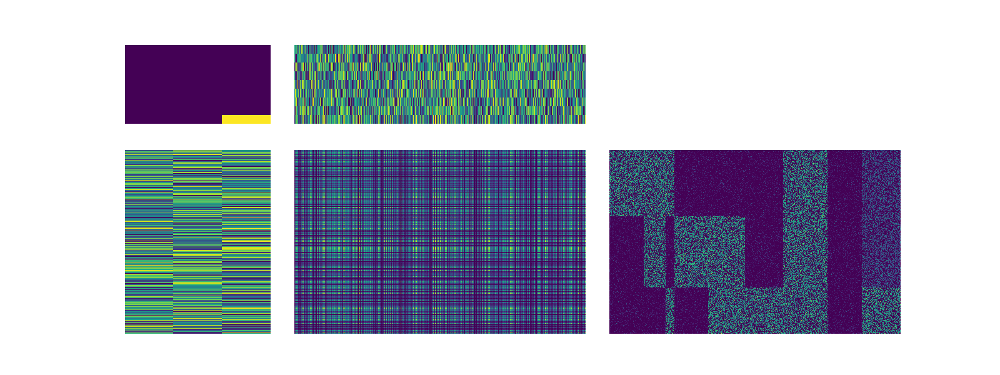

In [6]:
from IPython.display import Image

Image("NMTF_no_reg.gif")

In [6]:
scotch = SCOTCH.SCOTCH(k1 = 3, k2 = 9, max_l_u = 0.15, max_l_v = 0.15, term_tol = 1e-10, var_lambda= False, device = "cpu", init_style="random", max_iter=1000)
scotch.draw_intermediate_graph = True
scotch.addDataFromAData(adata)
scotch.fit()

Initializing NMTF factors
Beginning NMTF
Iter: 1	Iter Time: 0.184	Total Time: 0.184	Error: 8.179e+06	Relative Delta Residual: 2.102e-01
Iter: 2	Iter Time: 0.158	Total Time: 0.342	Error: 7.971e+06	Relative Delta Residual: 2.539e-02
Iter: 3	Iter Time: 0.167	Total Time: 0.509	Error: 7.528e+06	Relative Delta Residual: 5.562e-02
Iter: 4	Iter Time: 0.163	Total Time: 0.671	Error: 7.331e+06	Relative Delta Residual: 2.615e-02
Iter: 5	Iter Time: 0.163	Total Time: 0.834	Error: 7.228e+06	Relative Delta Residual: 1.402e-02
Iter: 6	Iter Time: 0.167	Total Time: 1.002	Error: 7.122e+06	Relative Delta Residual: 1.468e-02
Iter: 7	Iter Time: 0.162	Total Time: 1.164	Error: 6.987e+06	Relative Delta Residual: 1.901e-02
Iter: 8	Iter Time: 0.163	Total Time: 1.327	Error: 6.889e+06	Relative Delta Residual: 1.402e-02
Iter: 9	Iter Time: 0.166	Total Time: 1.493	Error: 6.861e+06	Relative Delta Residual: 4.105e-03
Iter: 10	Iter Time: 0.163	Total Time: 1.656	Error: 6.855e+06	Relative Delta Residual: 7.902e-04
Iter: 11

In [7]:
scotch.writeGIF('NMTF_lU_lV_0.15.gif')

writing gif to ./NMTF_lU_lV_0.15.gif


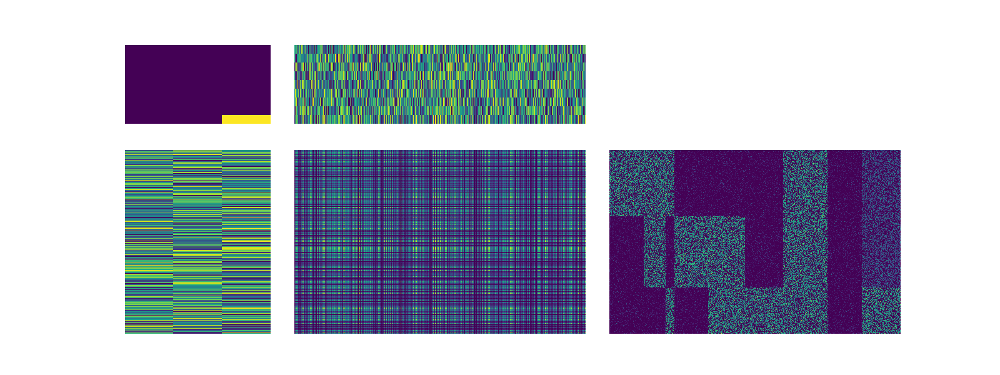

In [8]:
from IPython.display import Image

Image("NMTF_lU_lV_0.15.gif")

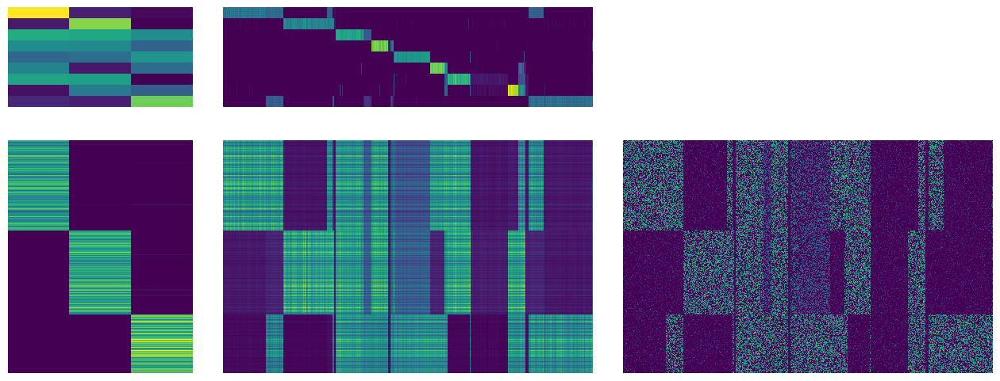

In [9]:
fig = scotch.visualizeFactorsSorted()
display(fig)

In [10]:
scotch.assign_cluster()

In [11]:
scotch.addScotchEmbeddingsToAnnData(adata)

AnnData object with n_obs × n_vars = 500 × 1000
    obs: 'cell_clusters'
    var: 'gene_clusters'
    uns: 'S_matrix'
    obsm: 'cell_embedding', 'P_embedding'
    varm: 'gene_embedding', 'Q_embedding'

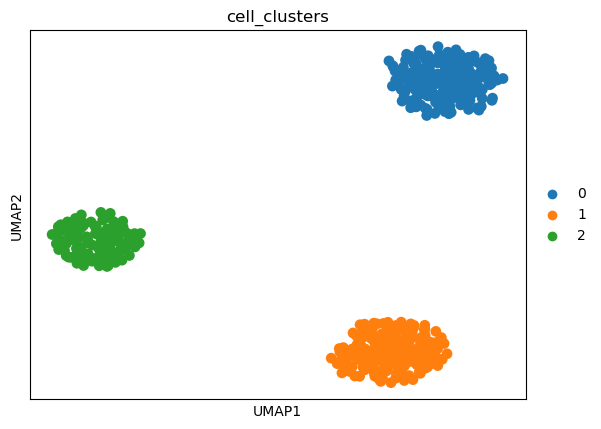

In [12]:
sc.pp.pca(adata)
sc.pp.neighbors(adata, use_rep= "X_pca")
sc.tl.umap(adata)
sc.pl.umap(adata, color = "cell_clusters")

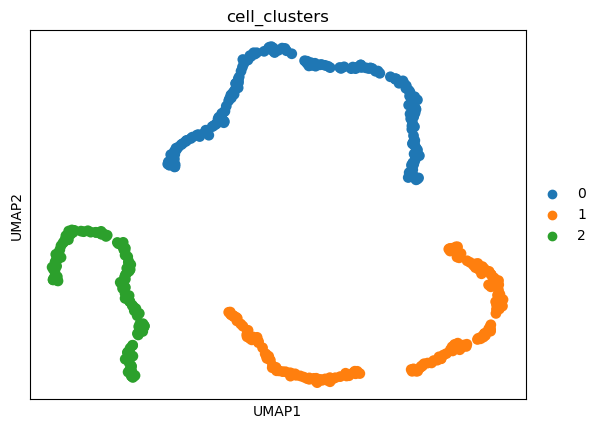

In [13]:
sc.pp.pca(adata)
sc.pp.neighbors(adata, use_rep= "cell_embedding")
sc.tl.umap(adata)
sc.pl.umap(adata, color = "cell_clusters")

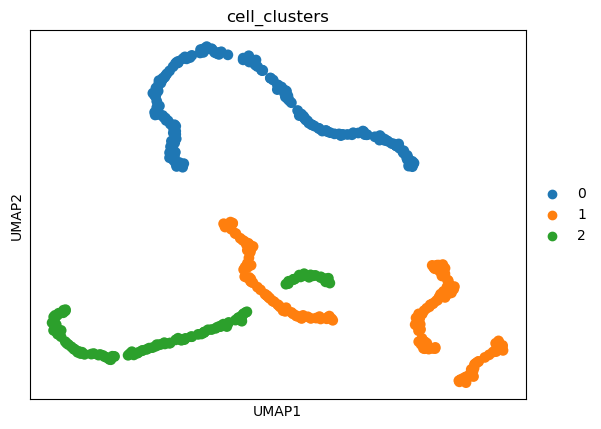

In [14]:
sc.pp.pca(adata)
sc.pp.neighbors(adata, use_rep= "P_embedding")
sc.tl.umap(adata)
sc.pl.umap(adata, color = "cell_clusters")

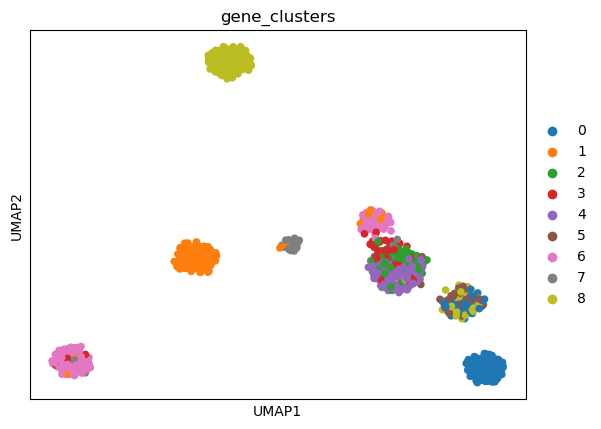

In [15]:
adata_genes = adata.T
sc.pp.pca(adata_genes)
sc.pp.neighbors(adata_genes, use_rep= "X_pca")
sc.tl.umap(adata_genes)
sc.pl.umap(adata_genes, color = "gene_clusters")

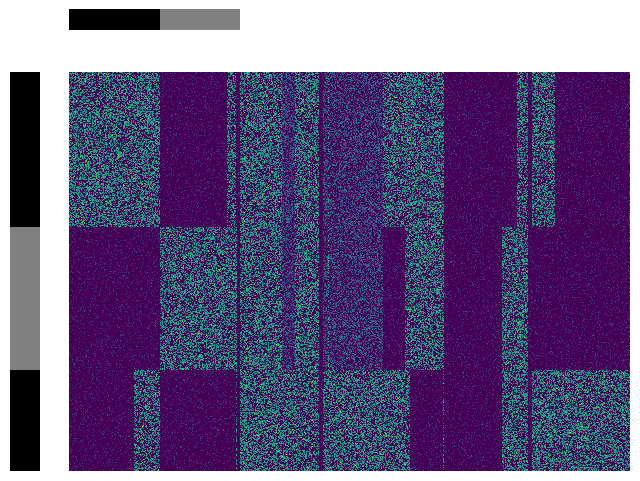

In [17]:
scotch.visualizeClustersSorted()

In [18]:
scotch.reclusterV()

Iter: 1	Iter Time: 0.169	Total Time: 0.169	Error: 6.858e+06	Relative Delta Residual: 7.597e-04
Iter: 2	Iter Time: 0.125	Total Time: 0.294	Error: 6.858e+06	Relative Delta Residual: -6.657e-05
Iter: 3	Iter Time: 0.125	Total Time: 0.419	Error: 6.859e+06	Relative Delta Residual: -1.027e-04
Iter: 4	Iter Time: 0.119	Total Time: 0.538	Error: 6.859e+06	Relative Delta Residual: -5.154e-05
Iter: 5	Iter Time: 0.135	Total Time: 0.674	Error: 6.859e+06	Relative Delta Residual: -3.601e-05
Iter: 6	Iter Time: 0.126	Total Time: 0.800	Error: 6.860e+06	Relative Delta Residual: -3.550e-05
Iter: 7	Iter Time: 0.118	Total Time: 0.918	Error: 6.860e+06	Relative Delta Residual: -4.162e-05
Iter: 8	Iter Time: 0.123	Total Time: 1.041	Error: 6.860e+06	Relative Delta Residual: -4.942e-05
Iter: 9	Iter Time: 0.136	Total Time: 1.178	Error: 6.861e+06	Relative Delta Residual: -6.049e-05
Iter: 10	Iter Time: 0.124	Total Time: 1.301	Error: 6.861e+06	Relative Delta Residual: -6.770e-05
Iter: 11	Iter Time: 0.117	Total Time: 1.

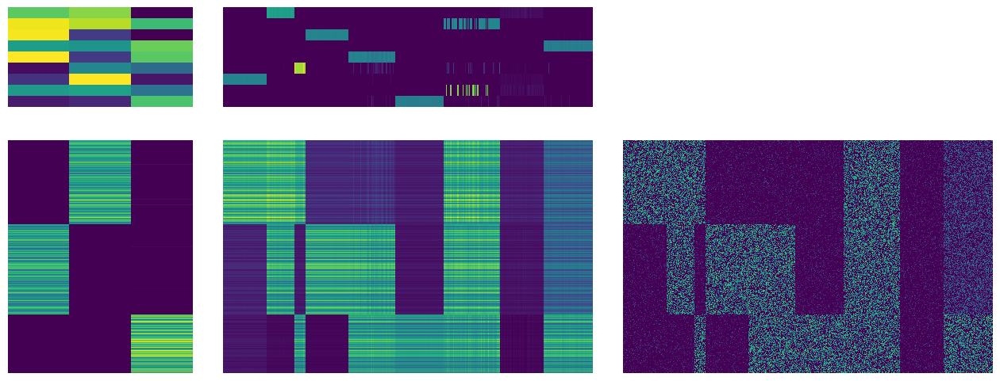

In [19]:
scotch.visualizeFactors()

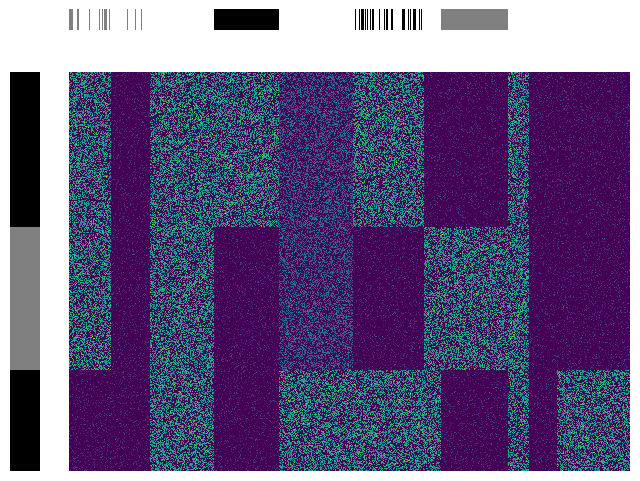

In [21]:
scotch.visualizeClustersSorted()